# Project 1: Sex Differences in brain organization

### Main Script: STRUCTURE-FUNCTION comparison

## Load packages

In [11]:
# General
import os
import sys
import numpy as np
import pandas as pd
import csv
import math
from math import isnan
import statistics
import pingouin as pg
import pickle

# Computing
import scipy.io  # loadmat
from scipy import stats
import sklearn 
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM

# Visualisation
import matplotlib.pyplot as plt 
import seaborn as sns
import vtk
from IPython.display import display
import matplotlib.collections as clt
import ptitprince as pt

# Neuroimaging
import nibabel
import nilearn
from brainstat.datasets import fetch_parcellation
from enigmatoolbox.permutation_testing import spin_test, shuf_test

# Gradients
import brainspace
from brainspace.datasets import load_parcellation, load_conte69
from brainspace.plotting import plot_hemispheres
from brainspace.gradient import GradientMaps
from brainspace.utils.parcellation import map_to_labels

## Define directories

In [22]:
codedir = os.path.abspath('')  # obtain current direction from which script is runnning

datadir = '/data/p_02667/sex_diff_gradients/data/'

resdir_gsp = '/data/p_02667/sex_diff_gradients/results/GSP/'
resdir_hcp = '/data/p_02667/sex_diff_gradients/results/HCP/'
resdir_fig = '/data/p_02667/sex_diff_gradients/results/figures/'

## Import functions

In [39]:
%run p1_myfunctions.ipynb

# Data 

## Import the Yeo 7 network coding for the Schaefer 400 parcellation scheme 

(i.e., which network each parcel belongs to)



- **So a parcel cannot belong to more than 1 network..? LIMITATION NO? -> Yes. Shanmugan et al. (2022) for example use loading onto a network (i.e., not discrete)** 

In [14]:
# labels: 1=visual, 2=sensory motor, 3=dorsal attention, 4=ventral attention, 5=limbic, 6=fronto parietal, 7= DMN

with open(datadir+'yeo_7.csv') as f:
    reader = csv.reader(f)
    yeo7_networks = list(reader)[0]  # need [0] because the network values are contained in double brackets [[ ]]

Plotting the 7 Yeo networks on cortical surface

**TO DO:**
- no option of a map with 7 colors..? https://matplotlib.org/stable/tutorials/colors/colormaps.html
- there must be a better way of labelling the maps with actual names of networks (ie categorical)? maybe not, not the purpose of this plot hemispheres function


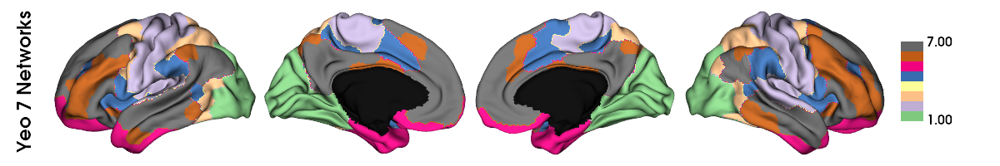

In [15]:
# need the the yeo network values (=dummy coding) to be in array format & float type in order to map_to_labels
yeo7_networks_array = []

for i in yeo7_networks:
    yeo7_networks_array.append(float(i))

yeo7_networks_array = np.asarray(yeo7_networks_array)



# defining labeling scheme and mask
labeling = load_parcellation('schaefer', scale=400, join=True)
surf_lh, surf_rh = load_conte69()

mask = labeling != 0

networks = map_to_labels(yeo7_networks_array, labeling, mask=mask, fill=np.nan)  # mean_grad contains 10 .gradients_ (1 gradient per column) - here I take all rows and individual select column based on gradient I want (first 3)

plot_hemispheres(surf_lh, surf_rh, array_name=networks, embed_nb = True, size=(1200, 200), cmap='Accent', color_bar=True, label_text=['Yeo 7 Networks'], zoom=1.55)


## Network labels ('Accent' cmap):
# 1 visual (green)
# 2 sensory motor (purple)
# 3 dorsal attention (beige)
# 4 ventral attention (blue)
# 5 limbic (fuchsia)
# 6 fronto parietal (brown)
# 7 DMN (grey)

This palette is to be used for every time that Yeo networks are displayed in color (except (a) for showing the networks plotted on the hemispheres - this dictionary doesn't work as cmap for plot_hemispheres; (b) the pie charts - dictionary format not recognized)

In [16]:
# original Yeo network colors
palette_labeled_networks = {'DMN': 'indianred',  
                            'dorsal attention' : 'forestgreen',  
                            'fronto parietal' : 'orange',  
                            'limbic' : 'lemonchiffon',  
                            'sensory motor' : 'steelblue',
                            'ventral attention' : 'orchid', 
                            'visual' : 'darkorchid'} 

This is not needed for the raincloud plot, just for the scatterplot G1 v G2 displaying networks

In [17]:
# making an array with yeo network labels (names instead of numbers)
yeo7_networks_array_labels = []

for i in yeo7_networks:
    if i == '1':
        yeo7_networks_array_labels.append('visual')
    elif i == '2':
        yeo7_networks_array_labels.append('sensory motor')
    elif i == '3':
        yeo7_networks_array_labels.append('dorsal attention')
    elif i == '4':
        yeo7_networks_array_labels.append('ventral attention')
    elif i == '5':
        yeo7_networks_array_labels.append('limbic')
    elif i == '6':
        yeo7_networks_array_labels.append('fronto parietal')
    elif i == '7':
        yeo7_networks_array_labels.append('DMN')

yeo7_networks_array_labels = np.asarray(yeo7_networks_array_labels)

In [18]:
network_names = ["visual", "sensory motor", "DMN", "dorsal attention", "ventral attention", "limbic", "fronto parietal"]

print("Number of parcels in each Yeo network:")
for i in range(len(network_names)):
    print(f"- {network_names[i]}: {yeo7_networks_array_labels.tolist().count(network_names[i])}")

Number of parcels in each Yeo network:
- visual: 61
- sensory motor: 77
- DMN: 90
- dorsal attention: 46
- ventral attention: 47
- limbic: 26
- fronto parietal: 53


## Fetch fsaverage parcellation (20484 vertices) coded for Schaefer 400 parcels - for Spin permutation tests

Spin permutation testing: https://enigma-toolbox.readthedocs.io/en/latest/pages/08.spintest/index.html -> requires data to be in fsaverage surface (not feasible with Schaefer parcellation)

**NOTE: schaefer_400_fs5 == 0 corresponds to midline (labels go from 0-400) -> disregard 0 in calculations and plotting**

In [19]:
# fetch the fsaverage parcellation labeling each of fsaverage5's 20484 vertices with its corresponding Schaefer parcel
schaefer_400_fs5 = fetch_parcellation("fsaverage5", "schaefer", 400)

## Structure & function data required run this script

In [20]:
### Structure-function covariance (general - no link to sex)

# mean CT covariance matrix 
GSP_mean_ct_cov_matrix = pd.read_csv(datadir+'ct_matrices/GSP/GSP_mean_ct_cov_matrix.csv', header = None).to_numpy()
GSP_mean_ct_cov_matrix_M = pd.read_csv(datadir+'ct_matrices/GSP/GSP_mean_ct_cov_matrix_M.csv', header = None).to_numpy()
GSP_mean_ct_cov_matrix_F = pd.read_csv(datadir+'ct_matrices/GSP/GSP_mean_ct_cov_matrix_F.csv', header = None).to_numpy()

HCP_mean_ct_cov_matrix = pd.read_csv(datadir+'ct_matrices/HCP/HCP_mean_ct_cov_matrix.csv', header = None).to_numpy()
HCP_mean_ct_cov_matrix_M = pd.read_csv(datadir+'ct_matrices/HCP/HCP_mean_ct_cov_matrix_M.csv', header = None).to_numpy()
HCP_mean_ct_cov_matrix_F = pd.read_csv(datadir+'ct_matrices/HCP/HCP_mean_ct_cov_matrix_F.csv', header = None).to_numpy()

# mean FC matrix
GSP_mean_fc_matrix = pd.read_csv(resdir_gsp+'GSP_mean_fc_matrix.csv', header = None).to_numpy()
GSP_mean_fc_matrix_M = pd.read_csv(resdir_gsp+'GSP_mean_fc_matrix_M.csv', header = None).to_numpy()
GSP_mean_fc_matrix_F = pd.read_csv(resdir_gsp+'GSP_mean_fc_matrix_F.csv', header = None).to_numpy()

HCP_mean_fc_matrix = pd.read_csv(resdir_hcp+'HCP_mean_fc_matrix.csv', header = None).to_numpy()
HCP_mean_fc_matrix_M = pd.read_csv(resdir_hcp+'HCP_mean_fc_matrix_M.csv', header = None).to_numpy()
HCP_mean_fc_matrix_F = pd.read_csv(resdir_hcp+'HCP_mean_fc_matrix_F.csv', header = None).to_numpy()



### Structure-function sex difference covariance (covariance of sex effects) 

## R results structure (local CT)

# GSP model: linear model = Gradient_loadings ~ Sex + Age + Global CT 
GSP_R_lm_ct_local_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_ct_local_sex_contrast_res.csv')  

# HCP model: linear mixed effects model = Gradient_loadings ~ Sex + Age + Global CT + random effect family relatedness + random effect twin status + random effect (family relatedness * twin status) 
HCP_R_lmer_ct_local_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_ct_local_sex_contrast_res.csv')  


## R results structure (CT gradients)

# GSP model: linear model = Gradient_loadings ~ Sex + Age + Global CT 
GSP_R_lm_ct_G1_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_ct_G1_sex_contrast_res.csv')  
GSP_R_lm_ct_G2_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_ct_G2_sex_contrast_res.csv')  

# HCP model: linear mixed effects model = Gradient_loadings ~ Sex + Age + Global CT + random effect family relatedness + random effect twin status + random effect (family relatedness * twin status) 
HCP_R_lmer_ct_G1_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_ct_G1_sex_contrast_res.csv')  
HCP_R_lmer_ct_G2_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_ct_G2_sex_contrast_res.csv')  


## R results function (functional gradients)

# GSP model: linear model = Gradient_loadings ~ Sex + Age + ICV 
GSP_R_lm_fc_G1_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_fc_G1_sex_contrast_res.csv')  
GSP_R_lm_fc_G2_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_fc_G2_sex_contrast_res.csv')  
GSP_R_lm_fc_G3_sex_contrast_res = pd.read_csv(resdir_gsp+'R_lm_fc_G3_sex_contrast_res.csv')  

# HCP model: linear mixed effects model = Gradient_loadings ~ Sex + Age + ICV + random effect family relatedness + random effect twin status + random effect (family relatedness * twin status) 
HCP_R_lmer_fc_G1_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_fc_G1_sex_contrast_res.csv')  
HCP_R_lmer_fc_G2_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_fc_G2_sex_contrast_res.csv')  
HCP_R_lmer_fc_G3_sex_contrast_res = pd.read_csv(resdir_hcp+'R_lmer_fc_G3_sex_contrast_res.csv')  


# Structure-function covariance (general - no link to sex) 
## Structural connectivity: local CT (400x400 mean matrix) ; Functional connectivity (400x400 mean matrix)

## Across sexes

### GSP

Significant row-wise correlations between mean structural GSP and mean functional GSP matrices: 296
Significant row-wise correlations between mean structural GSP and mean functional GSP matrices: (Bonferroni corrected; alpha = 0.05/400 = 0.000125): 168


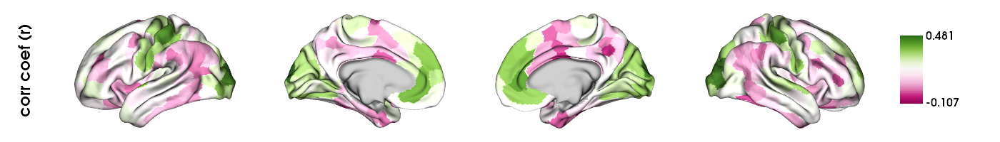

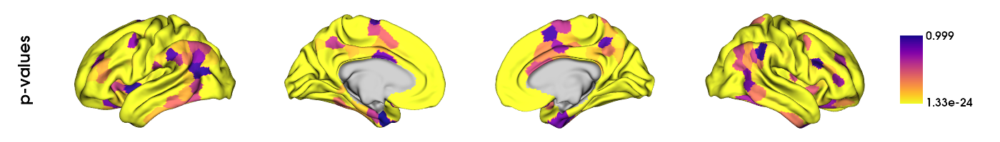

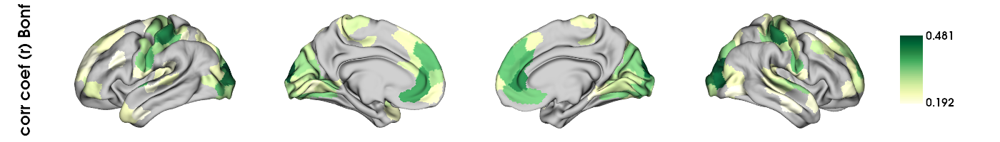

In [65]:
plots_to_display = row_wise_correlation_matrices(x = GSP_mean_ct_cov_matrix, y = GSP_mean_fc_matrix, label_x = 'mean structural GSP', label_y = 'mean functional GSP')
display(*plots_to_display)

### HCP

Significant row-wise correlations between mean structural HCP and mean functional HCP matrices: 315
Significant row-wise correlations between mean structural HCP and mean functional HCP matrices: (Bonferroni corrected; alpha = 0.05/400 = 0.000125): 215


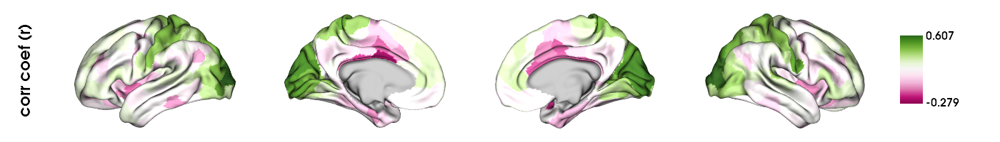

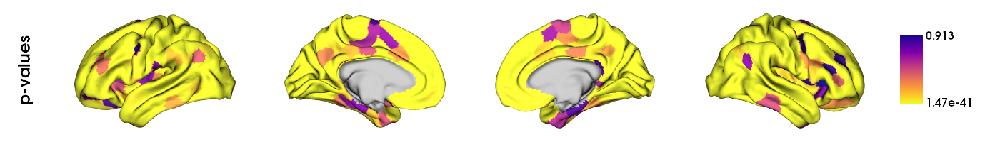

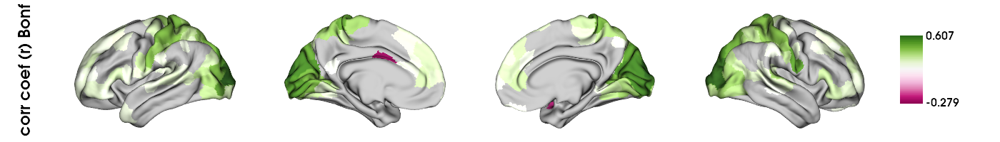

In [66]:
plots_to_display = row_wise_correlation_matrices(x = HCP_mean_ct_cov_matrix, y = HCP_mean_fc_matrix, label_x = 'mean structural HCP', label_y = 'mean functional HCP')
display(*plots_to_display)

## By sex

(this is just exploratory - by curiosity)

### GSP

#### Males

Significant row-wise correlations between mean structural GSP (males) and mean functional GSP (males) matrices: 283
Significant row-wise correlations between mean structural GSP (males) and mean functional GSP (males) matrices: (Bonferroni corrected; alpha = 0.05/400 = 0.000125): 157


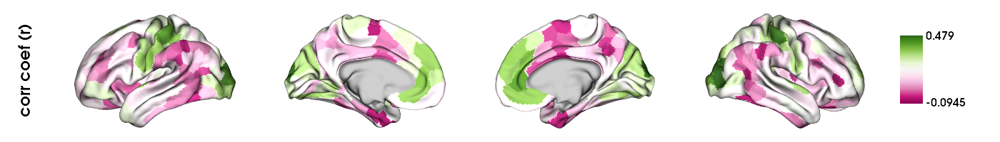

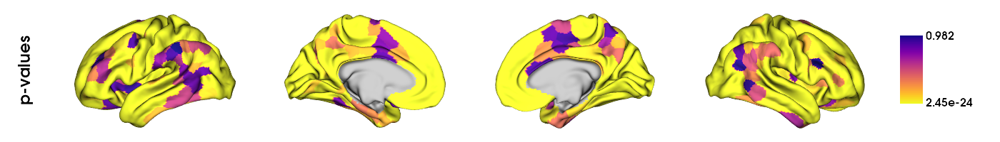

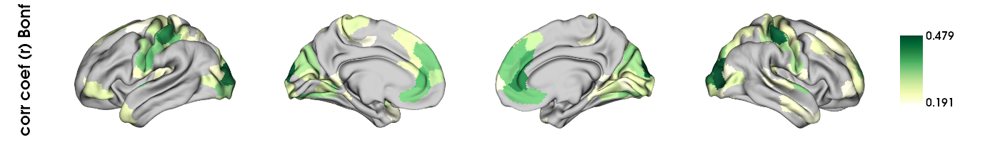

In [67]:
plots_to_display = row_wise_correlation_matrices(x = GSP_mean_ct_cov_matrix_M, y = GSP_mean_fc_matrix_M, label_x = 'mean structural GSP (males)', label_y = 'mean functional GSP (males)')
display(*plots_to_display)

#### Females

Significant row-wise correlations between mean structural GSP (females) and mean functional GSP (females) matrices: 291
Significant row-wise correlations between mean structural GSP (females) and mean functional GSP (females) matrices: (Bonferroni corrected; alpha = 0.05/400 = 0.000125): 163


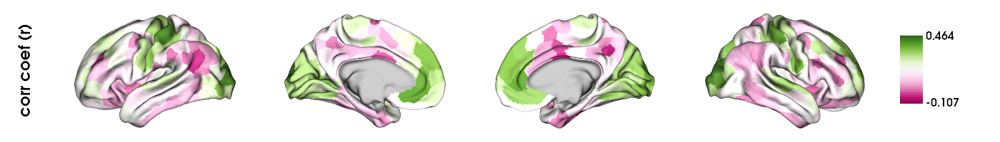

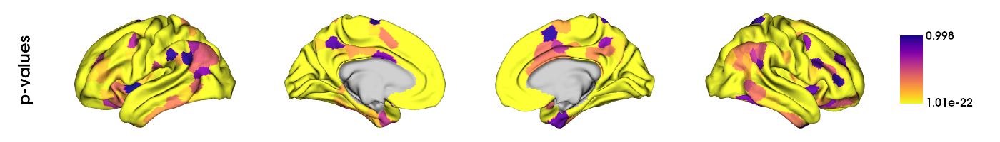

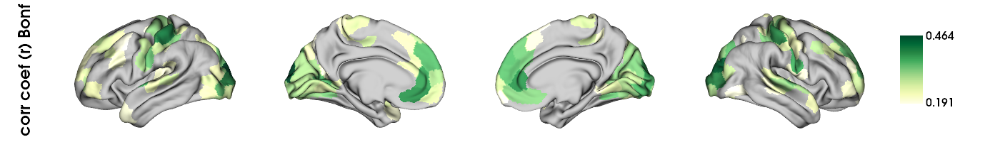

In [68]:
plots_to_display = row_wise_correlation_matrices(x = GSP_mean_ct_cov_matrix_F, y = GSP_mean_fc_matrix_F, label_x = 'mean structural GSP (females)', label_y = 'mean functional GSP (females)')
display(*plots_to_display)

### HCP

#### Males

Significant row-wise correlations between mean structural HCP (males) and mean functional HCP (males) matrices: 297
Significant row-wise correlations between mean structural HCP (males) and mean functional HCP (males) matrices: (Bonferroni corrected; alpha = 0.05/400 = 0.000125): 200


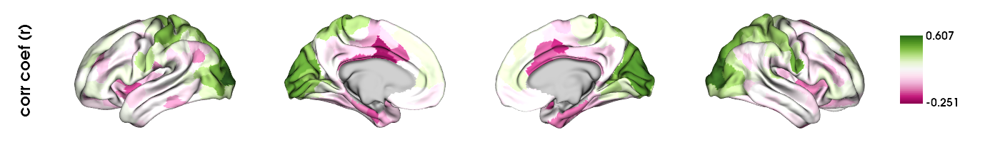

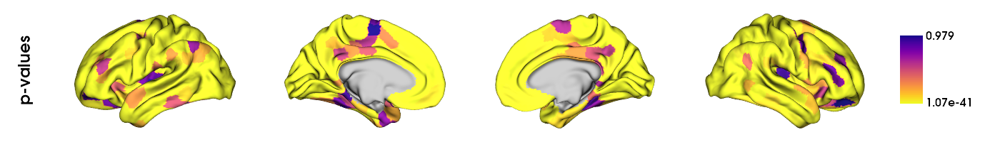

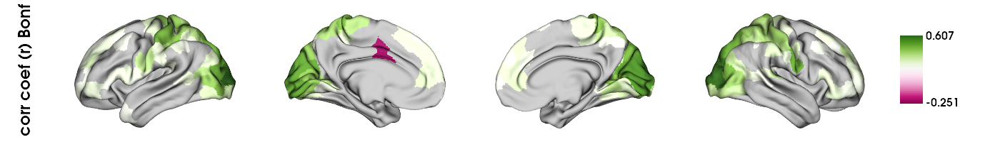

In [69]:
plots_to_display = row_wise_correlation_matrices(x = HCP_mean_ct_cov_matrix_M, y = HCP_mean_fc_matrix_M, label_x = 'mean structural HCP (males)', label_y = 'mean functional HCP (males)')
display(*plots_to_display)

#### Females

Significant row-wise correlations between mean structural HCP (females) and mean functional HCP (females) matrices: 314
Significant row-wise correlations between mean structural HCP (females) and mean functional HCP (females) matrices: (Bonferroni corrected; alpha = 0.05/400 = 0.000125): 210


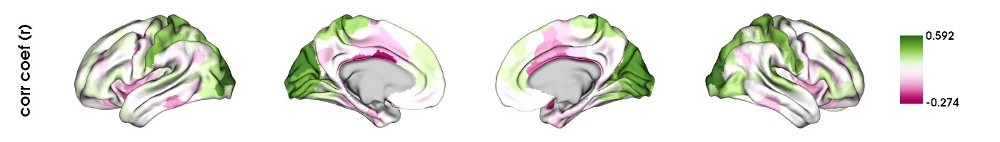

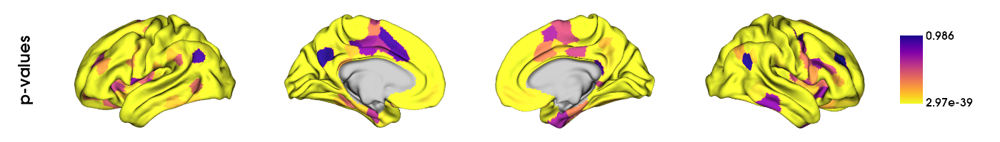

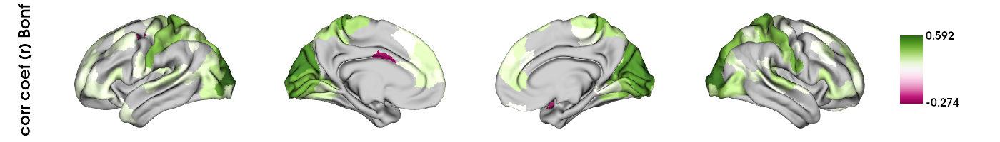

In [70]:
plots_to_display = row_wise_correlation_matrices(x = HCP_mean_ct_cov_matrix_F, y = HCP_mean_fc_matrix_F, label_x = 'mean structural HCP (females)', label_y = 'mean functional HCP (females)')
display(*plots_to_display)

# Structure-function sex difference covariance (covariance of sex effects) 
## Structure: local CT; Function: FC gradients

## GSP

### Correlation t-values

Overall Pearson correlation between GSP sex contrast G2 t-values and GSP sex contrast local CT t-values: r = 0.1; p = 0.049

visual: r = -0.14, p = 0.29
sensory motor: r = -0.04, p = 0.709
dorsal attention: r = 0.22, p = 0.136
ventral attention: r = -0.04, p = 0.779
limbic: r = -0.01, p = 0.979
fronto parietal: r = 0.01, p = 0.922
DMN: r = 0.15, p = 0.164




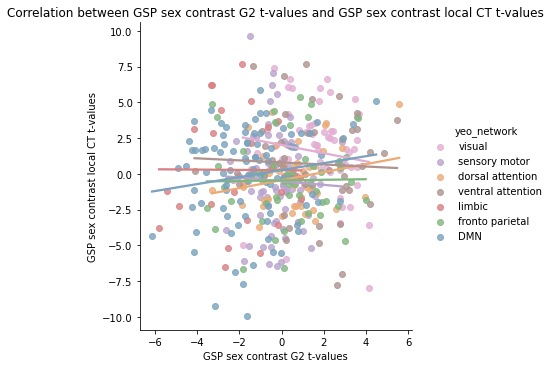

In [74]:
print_plot_corr_networks(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = GSP_R_lm_ct_local_sex_contrast_res.t_val_sex, x_label = 'GSP sex contrast G2 t-values', y_label = 'GSP sex contrast local CT t-values')

#### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.217


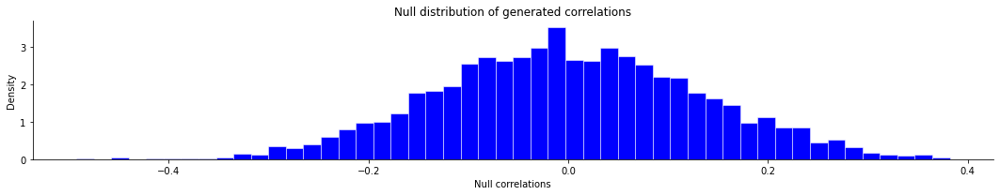

In [75]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = GSP_R_lm_ct_local_sex_contrast_res.t_val_sex)

### Comparing parcels showing statistically significant sex differences between structure and function

Number of parcels that show statistically significant sex differences across datasets: 51
Number of parcels that show statistically significant sex differences in GSP G2 fc only: 54
Number of parcels that show statistically significant sex differences in GSP local CT only: 128
Number of parcels (out of the 51 parcels that show sig sex differences in both datasets) which show sex differences in opposite directions: 22



'Overlap of significant sex differences: 2 (dark green): significant in both samples, 1 (light green): significant in one sample, 0: not significant'

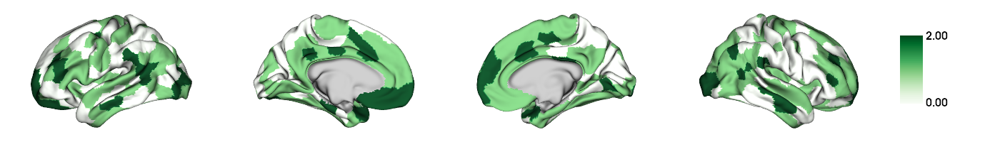

'Which dataset shows significant sex difference: +1 (red) GSP G2 fc, -1 (green) = GSP local CT, 0 (yellow) = both datasets, nan (grey) = not significant in any dataset'

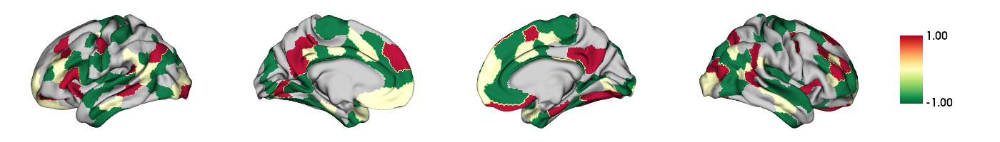

'Parcels showing sex differences in opposite directions'

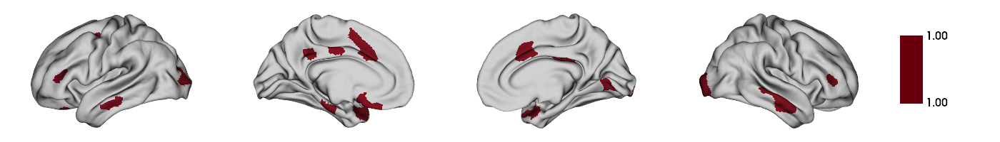

'mean t-values for overlapping significant parcels (FDR-corrected, q < 0.05) across samples (male: blue, female: red)'

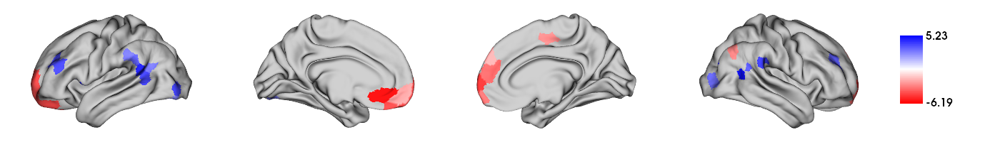

In [25]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = GSP_R_lm_ct_local_sex_contrast_res, sample_1_label = "GSP G2 fc", sample_2_label = "GSP local CT", save_screenshot = False, modality = 'GSP_across_modality')
display(*plots_to_display)

### Visualizing t-values of sex contrast by network

Minimum positive significant t-value in FC gradient: 2.5
Minimum negative significant t-value in FC gradient: -2.56

Number of positive significant t-values (M > F (gradient loadings)) in FC gradient: 56 -> by network: {'visual': 19, 'sensory motor': 2, 'dorsal attention': 4, 'ventral attention': 19, 'limbic': 0, 'fronto parietal': 8, 'DMN': 4}
Number of negative significant t-values (F > M (gradient loadings)) in FC gradient: 49 -> by network: {'visual': 0, 'sensory motor': 1, 'dorsal attention': 1, 'ventral attention': 1, 'limbic': 11, 'fronto parietal': 6, 'DMN': 29}


Minimum positive significant t-value in local CT: 2.29
Minimum negative significant t-value in local CT: -2.31

Number of positive significant t-values (M > F (gradient loadings)) in local CT: 99 -> by network: {'visual': 25, 'sensory motor': 14, 'dorsal attention': 6, 'ventral attention': 15, 'limbic': 9, 'fronto parietal': 9, 'DMN': 21}
Number of negative significant t-values (F > M (gradient loadings)) in local CT:

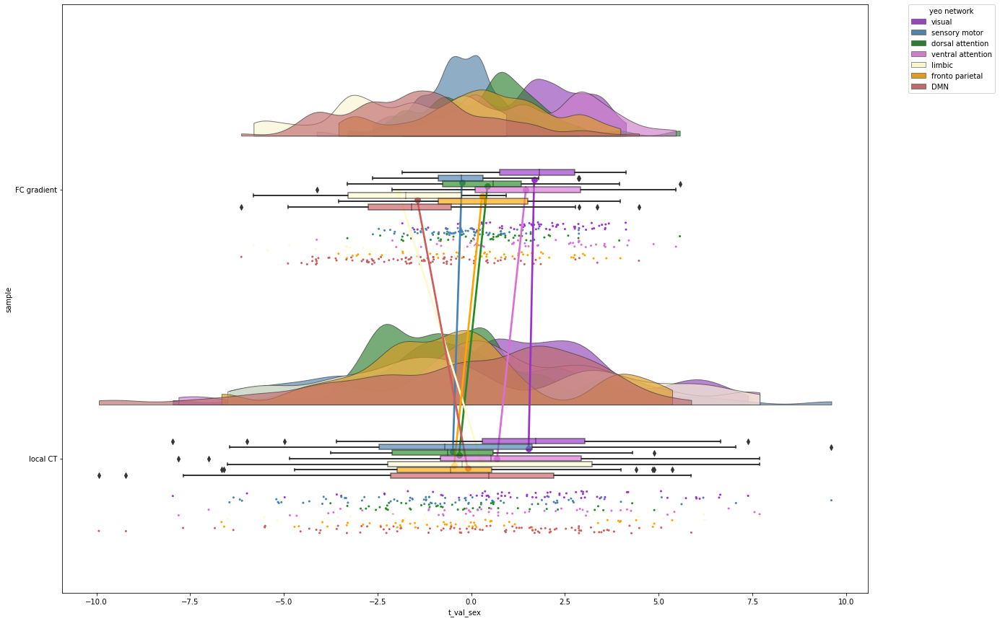

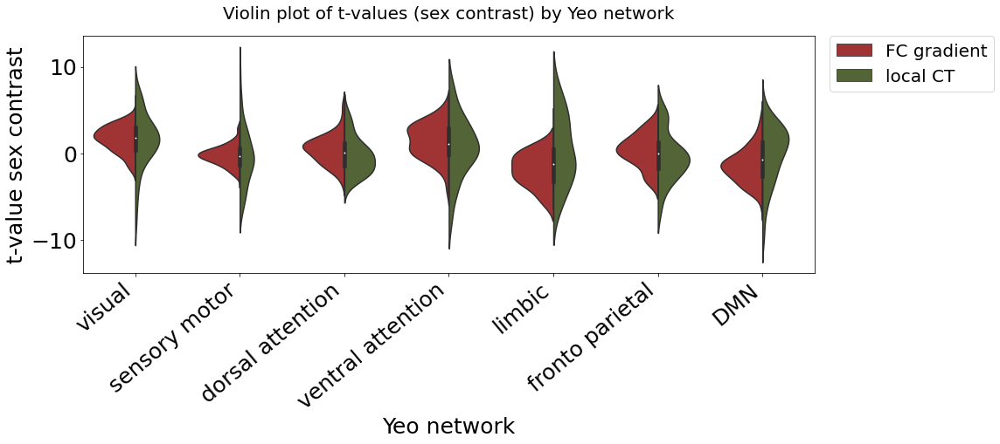

In [41]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = GSP_R_lm_ct_local_sex_contrast_res, sample_1_label = "FC gradient", sample_2_label = "local CT", save_violin_plot = True, title = 'GSP_across_modalities')

## HCP

### Correlation t-values

Overall Pearson correlation between HCP sex contrast G1 t-values and HCP sex contrast local CT t-values: r = 0.08; p = 0.118

visual: r = -0.25, p = 0.056
sensory motor: r = 0.26, p = 0.021
dorsal attention: r = 0.34, p = 0.02
ventral attention: r = 0.17, p = 0.266
limbic: r = 0.01, p = 0.978
fronto parietal: r = 0.1, p = 0.484
DMN: r = -0.1, p = 0.342




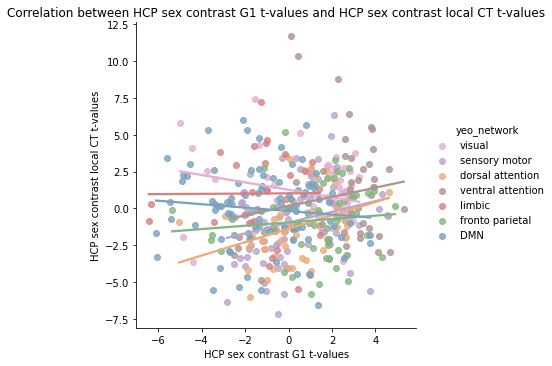

In [78]:
print_plot_corr_networks(x = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, y = HCP_R_lmer_ct_local_sex_contrast_res.t_val_sex, x_label = 'HCP sex contrast G1 t-values', y_label = 'HCP sex contrast local CT t-values')

#### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.268


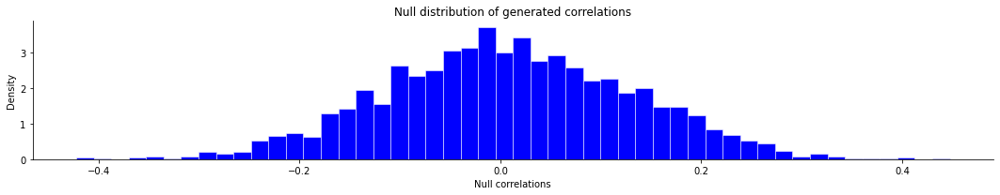

In [79]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, y = HCP_R_lmer_ct_local_sex_contrast_res.t_val_sex)

### Comparing parcels showing statistically significant sex differences between structure and function

Number of parcels that show statistically significant sex differences across datasets: 47
Number of parcels that show statistically significant sex differences in HCP G1 fc only: 87
Number of parcels that show statistically significant sex differences in HCP local CT only: 112
Number of parcels (out of the 47 parcels that show sig sex differences in both datasets) which show sex differences in opposite directions: 22



'Overlap of significant sex differences: 2 (dark green): significant in both samples, 1 (light green): significant in one sample, 0: not significant'

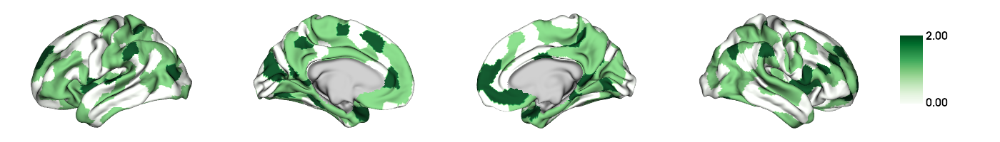

'Which dataset shows significant sex difference: +1 (red) HCP G1 fc, -1 (green) = HCP local CT, 0 (yellow) = both datasets, nan (grey) = not significant in any dataset'

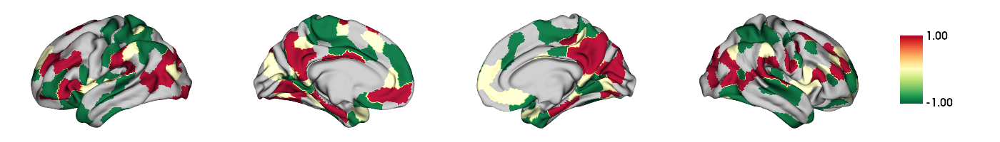

'Parcels showing sex differences in opposite directions'

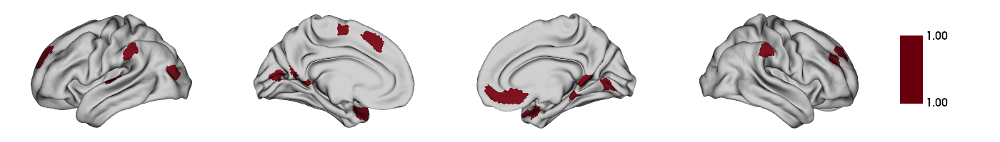

'mean t-values for overlapping significant parcels (FDR-corrected, q < 0.05) across samples (male: blue, female: red)'

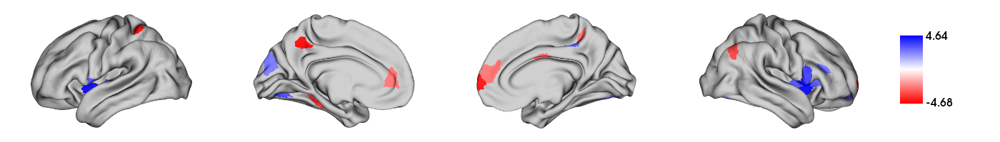

In [26]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = HCP_R_lmer_fc_G1_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_ct_local_sex_contrast_res, sample_1_label = "HCP G1 fc", sample_2_label = "HCP local CT",  save_screenshot = False, modality = 'HCP_across_modality')
display(*plots_to_display)

### Visualizing t-values of sex contrast by network

Minimum positive significant t-value in FC gradient: 2.41
Minimum negative significant t-value in FC gradient: -2.43

Number of positive significant t-values (M > F (gradient loadings)) in FC gradient: 82 -> by network: {'visual': 23, 'sensory motor': 8, 'dorsal attention': 4, 'ventral attention': 29, 'limbic': 0, 'fronto parietal': 13, 'DMN': 5}
Number of negative significant t-values (F > M (gradient loadings)) in FC gradient: 52 -> by network: {'visual': 6, 'sensory motor': 5, 'dorsal attention': 2, 'ventral attention': 1, 'limbic': 5, 'fronto parietal': 5, 'DMN': 28}


Minimum positive significant t-value in local CT: 2.35
Minimum negative significant t-value in local CT: -2.34

Number of positive significant t-values (M > F (gradient loadings)) in local CT: 74 -> by network: {'visual': 16, 'sensory motor': 9, 'dorsal attention': 5, 'ventral attention': 14, 'limbic': 10, 'fronto parietal': 6, 'DMN': 14}
Number of negative significant t-values (F > M (gradient loadings)) in local CT

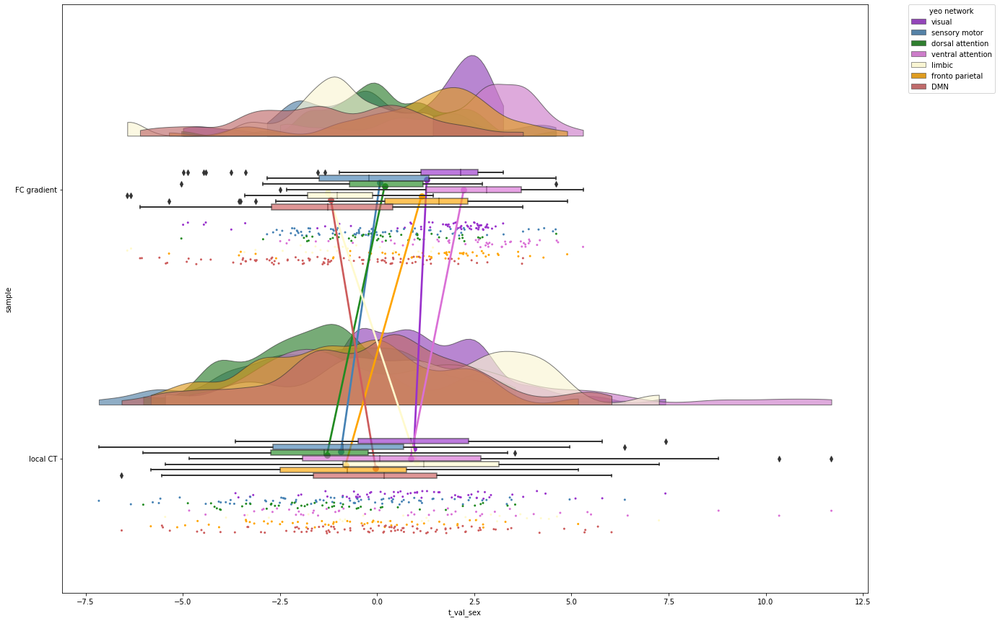

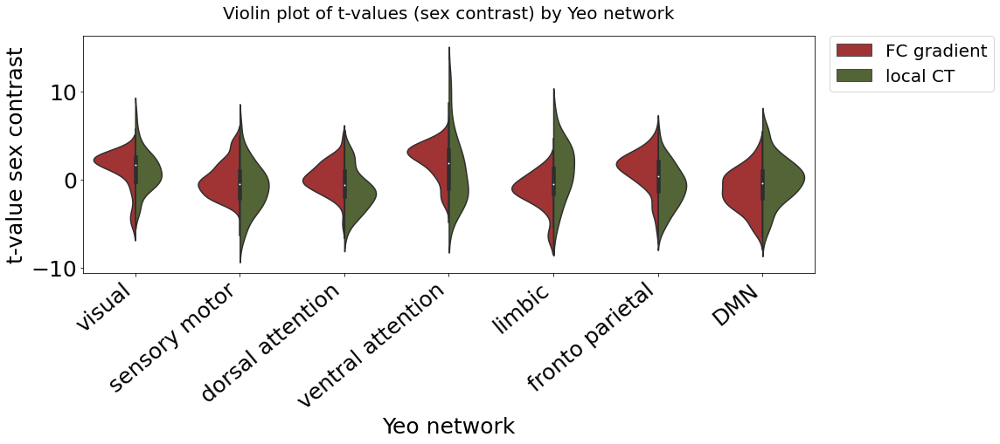

In [42]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = HCP_R_lmer_fc_G1_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_ct_local_sex_contrast_res, sample_1_label = "FC gradient", sample_2_label = "local CT", save_violin_plot = True, title = 'HCP_across_modalities')

# Structure-function sex difference covariance (covariance of sex effects) 
## Structure: CT gradients; Function: FC gradients

## GSP

### Unimodal-heteromodal fc gradient with G1 (posterior-anterior) CT gradient

#### Correlation t-values

Overall Pearson correlation between GSP sex contrast G2 fc t-values and GSP sex contrast G1 CT t-values: r = 0.2; p = 0.0

visual: r = 0.24, p = 0.067
sensory motor: r = 0.0, p = 0.999
dorsal attention: r = 0.23, p = 0.119
ventral attention: r = 0.15, p = 0.298
limbic: r = 0.06, p = 0.773
fronto parietal: r = 0.16, p = 0.264
DMN: r = 0.18, p = 0.092




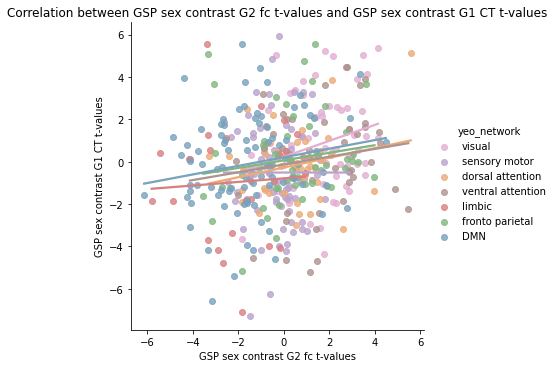

In [86]:
print_plot_corr_networks(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = GSP_R_lm_ct_G1_sex_contrast_res.t_val_sex, x_label = 'GSP sex contrast G2 fc t-values', y_label = 'GSP sex contrast G1 CT t-values')

#### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.0435


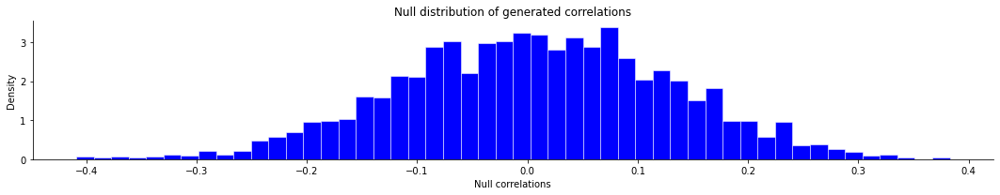

In [83]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = GSP_R_lm_ct_G1_sex_contrast_res.t_val_sex)

#### Comparing parcels showing statistically significant sex differences between structure and function

Number of parcels that show statistically significant sex differences across datasets: 24
Number of parcels that show statistically significant sex differences in GSP G2 fc only: 81
Number of parcels that show statistically significant sex differences in GSP G1 CT only: 73
Number of parcels (out of the 24 parcels that show sig sex differences in both datasets) which show sex differences in opposite directions: 5



'Overlap of significant sex differences: 2 (dark green): significant in both samples, 1 (light green): significant in one sample, 0: not significant'

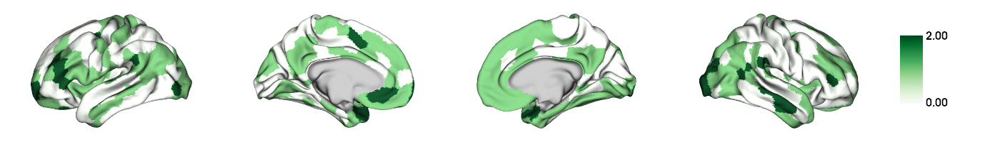

'Which dataset shows significant sex difference: +1 (purple) GSP G2 fc, -1 (brown) = GSP G1 CT, 0 (white) = both datasets, nan (grey) = not significant in any dataset'

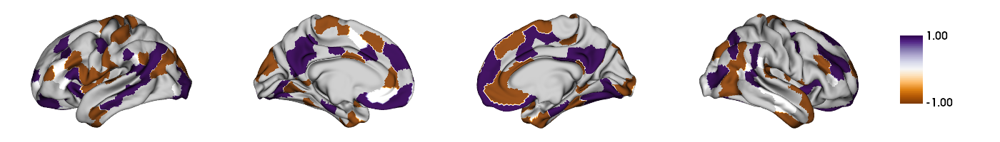

'Parcels showing sex differences in opposite directions'

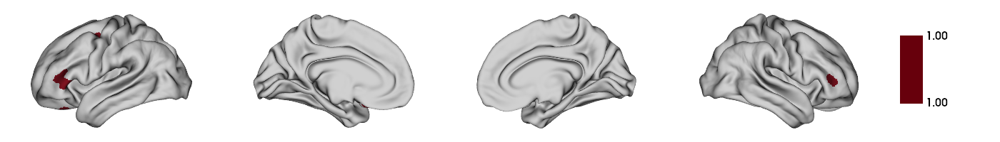

In [87]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = GSP_R_lm_ct_G1_sex_contrast_res, sample_1_label = "GSP G2 fc", sample_2_label = "GSP G1 CT")
display(*plots_to_display)

#### Visualizing t-values of sex contrast by network

Minimum positive significant t-value in GSP G2 fc: 2.5
Minimum negative significant t-value in GSP G2 fc: -2.56

Number of positive significant t-values (M > F (gradient loadings)) in GSP G2 fc: 56 -> by network: {'visual': 19, 'sensory motor': 2, 'dorsal attention': 4, 'ventral attention': 19, 'limbic': 0, 'fronto parietal': 8, 'DMN': 4}
Number of negative significant t-values (F > M (gradient loadings)) in GSP G2 fc: 49 -> by network: {'visual': 0, 'sensory motor': 1, 'dorsal attention': 1, 'ventral attention': 1, 'limbic': 11, 'fronto parietal': 6, 'DMN': 29}


Minimum positive significant t-value in GSP G1 CT: 2.52
Minimum negative significant t-value in GSP G1 CT: -2.65

Number of positive significant t-values (M > F (gradient loadings)) in GSP G1 CT: 52 -> by network: {'visual': 15, 'sensory motor': 8, 'dorsal attention': 2, 'ventral attention': 6, 'limbic': 2, 'fronto parietal': 9, 'DMN': 10}
Number of negative significant t-values (F > M (gradient loadings)) in GSP G1 CT: 45 ->

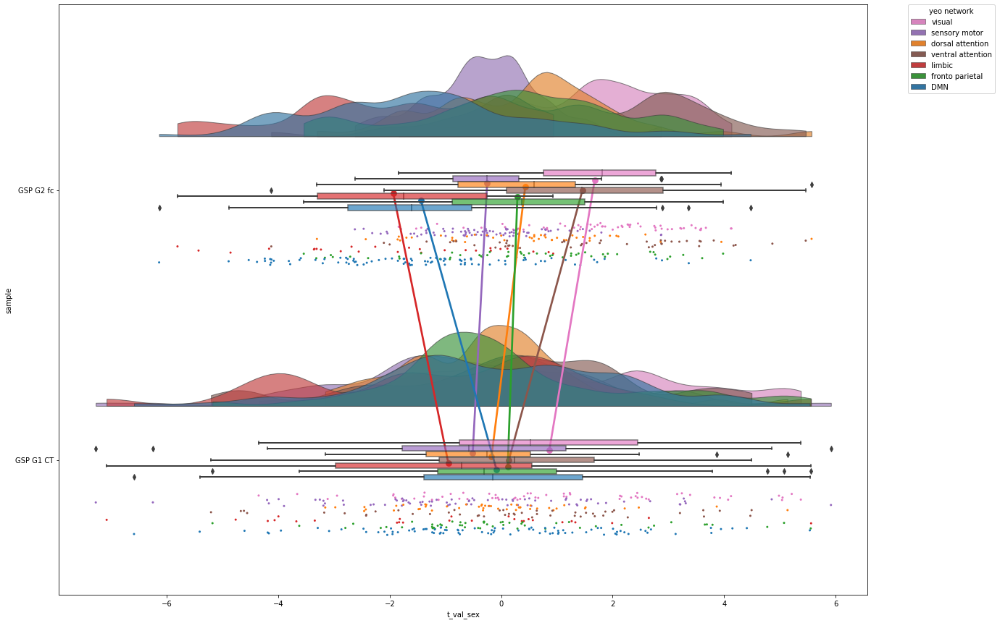

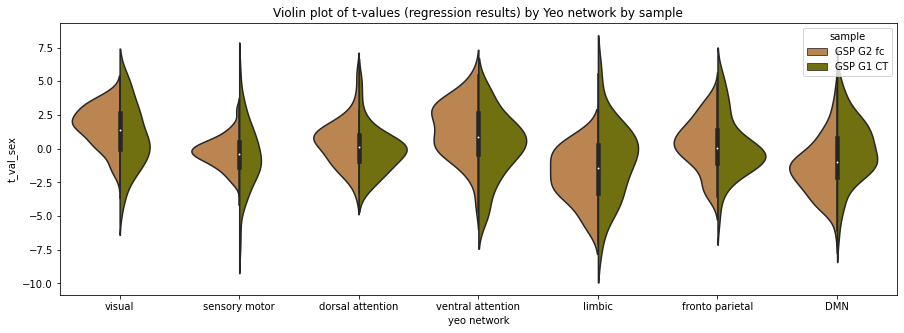

In [88]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = GSP_R_lm_ct_G1_sex_contrast_res, sample_1_label = "GSP G2 fc", sample_2_label = "GSP G1 CT")

### Unimodal-heteromodal fc gradient with G2 (inferior-superior) CT gradient

#### Correlation t-values

Overall Pearson correlation between GSP sex contrast G2 fc t-values and GSP sex contrast G2 CT t-values: r = 0.05; p = 0.369

visual: r = 0.08, p = 0.532
sensory motor: r = 0.13, p = 0.261
dorsal attention: r = -0.25, p = 0.099
ventral attention: r = -0.04, p = 0.794
limbic: r = 0.24, p = 0.237
fronto parietal: r = -0.18, p = 0.2
DMN: r = 0.17, p = 0.113




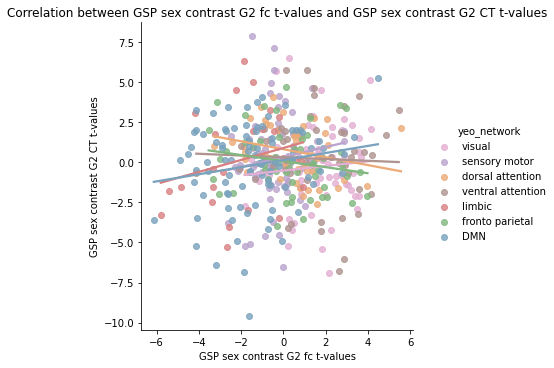

In [89]:
print_plot_corr_networks(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = GSP_R_lm_ct_G2_sex_contrast_res.t_val_sex, x_label = 'GSP sex contrast G2 fc t-values', y_label = 'GSP sex contrast G2 CT t-values')

#### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.4415


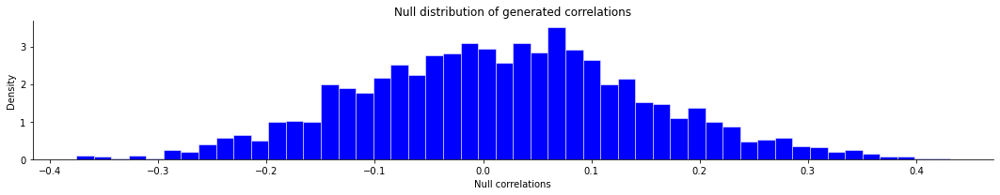

In [91]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = GSP_R_lm_fc_G2_sex_contrast_res.t_val_sex, y = GSP_R_lm_ct_G2_sex_contrast_res.t_val_sex)

#### Comparing parcels showing statistically significant sex differences between structure and function

Number of parcels that show statistically significant sex differences across datasets: 29
Number of parcels that show statistically significant sex differences in GSP G2 fc only: 76
Number of parcels that show statistically significant sex differences in GSP G2 CT only: 80
Number of parcels (out of the 29 parcels that show sig sex differences in both datasets) which show sex differences in opposite directions: 11



'Overlap of significant sex differences: 2 (dark green): significant in both samples, 1 (light green): significant in one sample, 0: not significant'

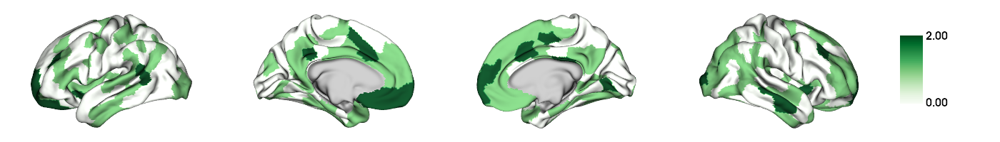

'Which dataset shows significant sex difference: +1 (purple) GSP G2 fc, -1 (brown) = GSP G2 CT, 0 (white) = both datasets, nan (grey) = not significant in any dataset'

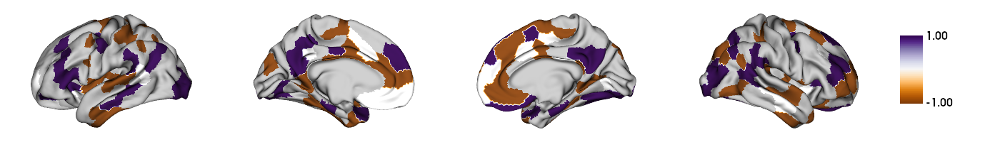

'Parcels showing sex differences in opposite directions'

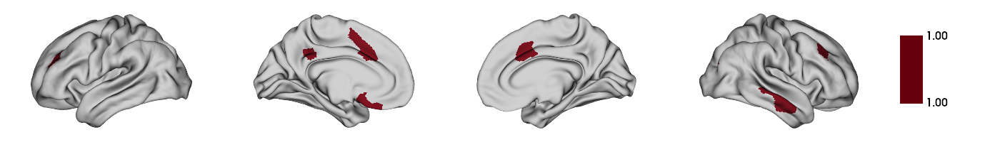

In [92]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = GSP_R_lm_ct_G2_sex_contrast_res, sample_1_label = "GSP G2 fc", sample_2_label = "GSP G2 CT")
display(*plots_to_display)

#### Visualizing t-values of sex contrast by network

Minimum positive significant t-value in GSP G2 fc: 2.5
Minimum negative significant t-value in GSP G2 fc: -2.56

Number of positive significant t-values (M > F (gradient loadings)) in GSP G2 fc: 56 -> by network: {'visual': 19, 'sensory motor': 2, 'dorsal attention': 4, 'ventral attention': 19, 'limbic': 0, 'fronto parietal': 8, 'DMN': 4}
Number of negative significant t-values (F > M (gradient loadings)) in GSP G2 fc: 49 -> by network: {'visual': 0, 'sensory motor': 1, 'dorsal attention': 1, 'ventral attention': 1, 'limbic': 11, 'fronto parietal': 6, 'DMN': 29}


Minimum positive significant t-value in GSP G2 CT: 2.64
Minimum negative significant t-value in GSP G2 CT: -2.47

Number of positive significant t-values (M > F (gradient loadings)) in GSP G2 CT: 54 -> by network: {'visual': 6, 'sensory motor': 10, 'dorsal attention': 7, 'ventral attention': 8, 'limbic': 6, 'fronto parietal': 8, 'DMN': 9}
Number of negative significant t-values (F > M (gradient loadings)) in GSP G2 CT: 55 -> 

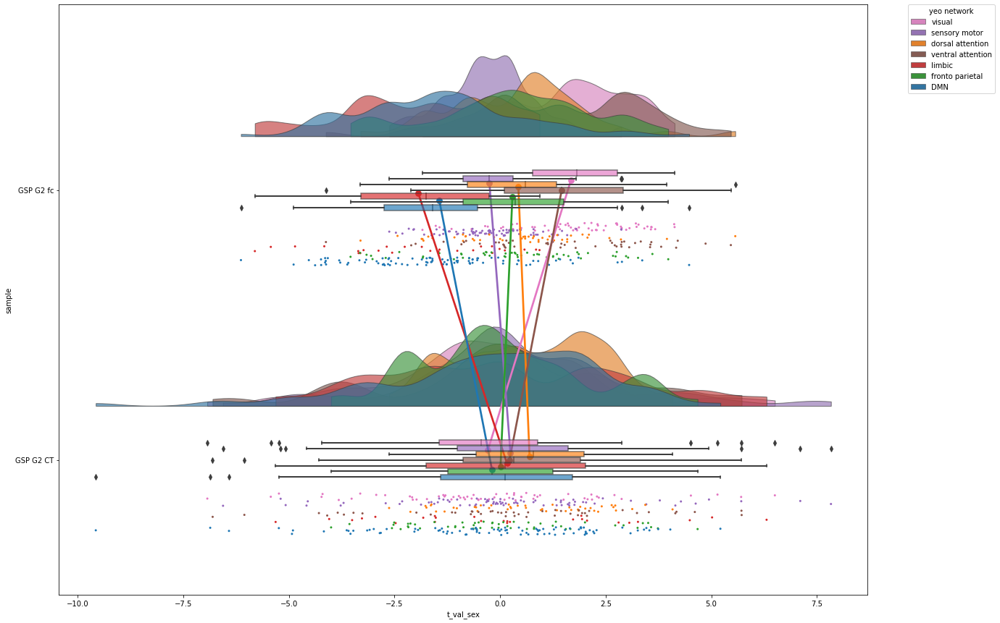

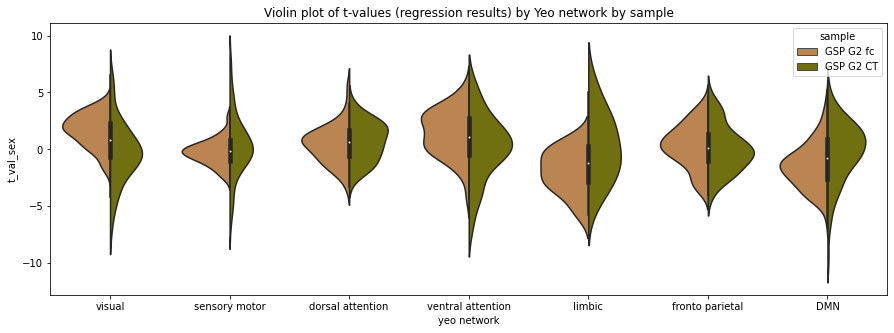

In [93]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = GSP_R_lm_fc_G2_sex_contrast_res, reg_res_sample_2 = GSP_R_lm_ct_G2_sex_contrast_res, sample_1_label = "GSP G2 fc", sample_2_label = "GSP G2 CT")

## HCP

### Unimodal-heteromodal fc gradient with G1 (posterior-anterior) CT gradient

#### Correlation t-values

Overall Pearson correlation between HCP sex contrast G1 t-values and HCP sex contrast G1 CT t-values: r = -0.06; p = 0.254

visual: r = -0.32, p = 0.012
sensory motor: r = 0.11, p = 0.336
dorsal attention: r = 0.24, p = 0.109
ventral attention: r = -0.02, p = 0.91
limbic: r = -0.14, p = 0.487
fronto parietal: r = -0.03, p = 0.829
DMN: r = -0.11, p = 0.314




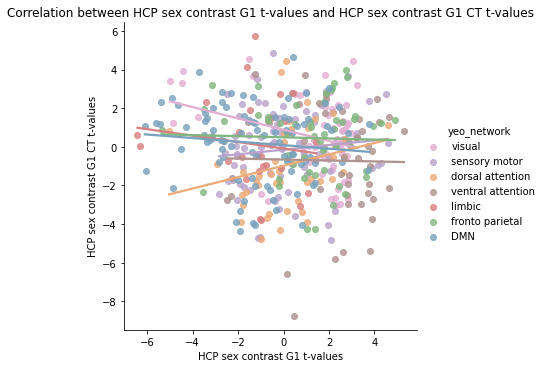

In [94]:
print_plot_corr_networks(x = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, y = HCP_R_lmer_ct_G1_sex_contrast_res.t_val_sex, x_label = 'HCP sex contrast G1 t-values', y_label = 'HCP sex contrast G1 CT t-values')

#### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.3095


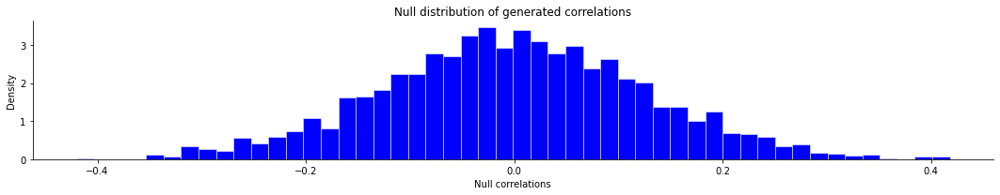

In [95]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, y = HCP_R_lmer_ct_G1_sex_contrast_res.t_val_sex)

#### Comparing parcels showing statistically significant sex differences between structure and function

Number of parcels that show statistically significant sex differences across datasets: 23
Number of parcels that show statistically significant sex differences in HCP G1 fc only: 111
Number of parcels that show statistically significant sex differences in HCP G1 CT only: 75
Number of parcels (out of the 23 parcels that show sig sex differences in both datasets) which show sex differences in opposite directions: 16



'Overlap of significant sex differences: 2 (dark green): significant in both samples, 1 (light green): significant in one sample, 0: not significant'

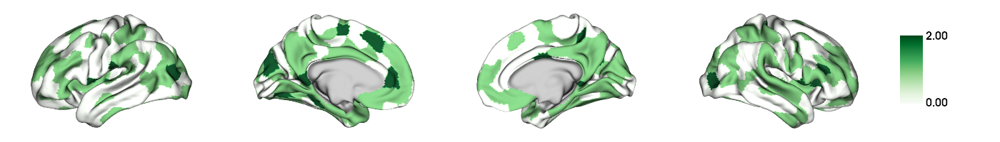

'Which dataset shows significant sex difference: +1 (purple) HCP G1 fc, -1 (brown) = HCP G1 CT, 0 (white) = both datasets, nan (grey) = not significant in any dataset'

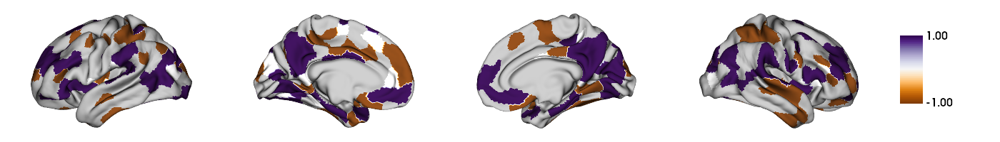

'Parcels showing sex differences in opposite directions'

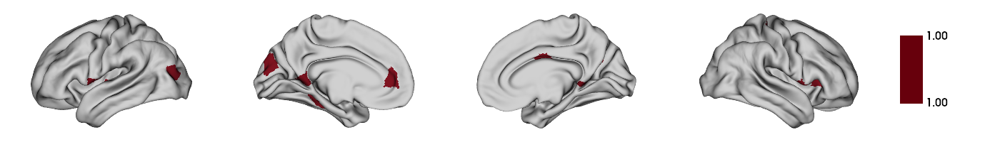

In [96]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = HCP_R_lmer_fc_G1_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_ct_G1_sex_contrast_res, sample_1_label = "HCP G1 fc", sample_2_label = "HCP G1 CT")
display(*plots_to_display)

#### Visualizing t-values of sex contrast by network

Minimum positive significant t-value in HCP G1 fc: 2.41
Minimum negative significant t-value in HCP G1 fc: -2.43

Number of positive significant t-values (M > F (gradient loadings)) in HCP G1 fc: 82 -> by network: {'visual': 23, 'sensory motor': 8, 'dorsal attention': 4, 'ventral attention': 29, 'limbic': 0, 'fronto parietal': 13, 'DMN': 5}
Number of negative significant t-values (F > M (gradient loadings)) in HCP G1 fc: 52 -> by network: {'visual': 6, 'sensory motor': 5, 'dorsal attention': 2, 'ventral attention': 1, 'limbic': 5, 'fronto parietal': 5, 'DMN': 28}


Minimum positive significant t-value in HCP G1 CT: 2.52
Minimum negative significant t-value in HCP G1 CT: -2.53

Number of positive significant t-values (M > F (gradient loadings)) in HCP G1 CT: 46 -> by network: {'visual': 11, 'sensory motor': 7, 'dorsal attention': 2, 'ventral attention': 4, 'limbic': 4, 'fronto parietal': 8, 'DMN': 10}
Number of negative significant t-values (F > M (gradient loadings)) in HCP G1 CT: 52 -

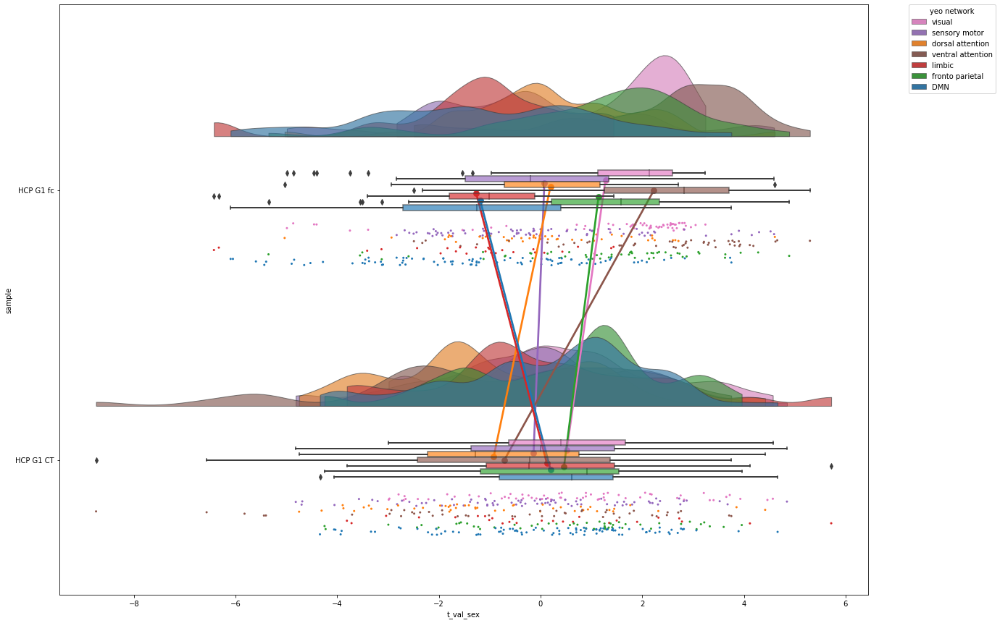

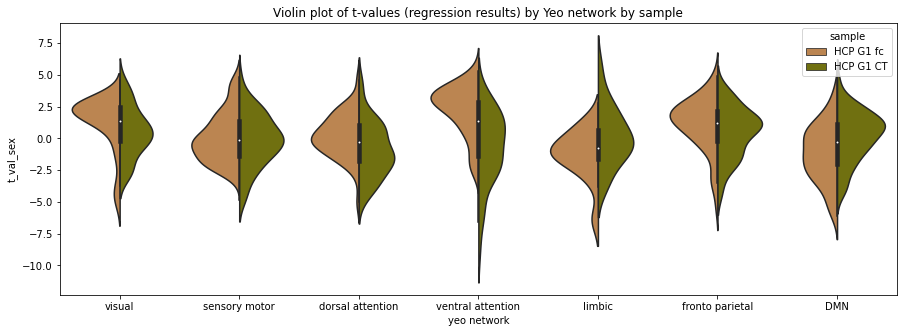

In [97]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = HCP_R_lmer_fc_G1_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_ct_G1_sex_contrast_res, sample_1_label = "HCP G1 fc", sample_2_label = "HCP G1 CT")

### Unimodal-heteromodal fc gradient with G2 (inferior-superior) CT gradient

#### Correlation t-values

Overall Pearson correlation between HCP sex contrast G1 t-values and HCP sex contrast G2 CT t-values: r = 0.02; p = 0.642

visual: r = 0.16, p = 0.222
sensory motor: r = 0.04, p = 0.71
dorsal attention: r = 0.22, p = 0.139
ventral attention: r = 0.08, p = 0.583
limbic: r = 0.35, p = 0.083
fronto parietal: r = -0.07, p = 0.604
DMN: r = -0.13, p = 0.215




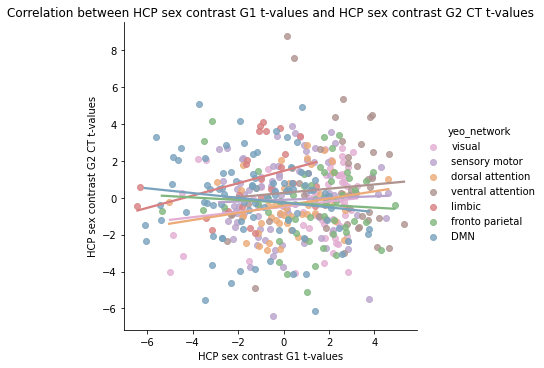

In [98]:
print_plot_corr_networks(x = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, y = HCP_R_lmer_ct_G2_sex_contrast_res.t_val_sex, x_label = 'HCP sex contrast G1 t-values', y_label = 'HCP sex contrast G2 CT t-values')

#### Spin permutation test (for correlation of t-values)

permutation 100 of 1000
permutation 200 of 1000
permutation 300 of 1000
permutation 400 of 1000
permutation 500 of 1000
permutation 600 of 1000
permutation 700 of 1000
permutation 800 of 1000
permutation 900 of 1000
permutation 1000 of 1000
Spin permutation test p-value: 0.4275


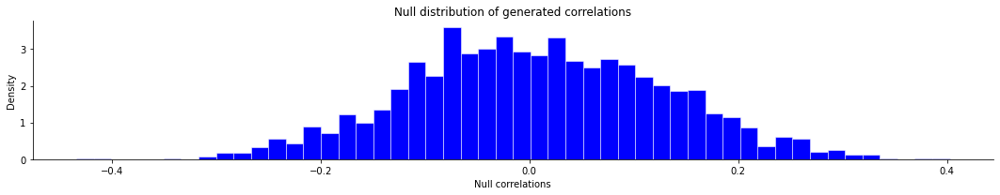

In [99]:
SpinPermutationTest_PearsonCorr_Schaefer400(x = HCP_R_lmer_fc_G1_sex_contrast_res.t_val_sex, y = HCP_R_lmer_ct_G2_sex_contrast_res.t_val_sex)

#### Comparing parcels showing statistically significant sex differences between structure and function

Number of parcels that show statistically significant sex differences across datasets: 27
Number of parcels that show statistically significant sex differences in HCP G1 fc only: 107
Number of parcels that show statistically significant sex differences in HCP G2 CT only: 56
Number of parcels (out of the 27 parcels that show sig sex differences in both datasets) which show sex differences in opposite directions: 16



'Overlap of significant sex differences: 2 (dark green): significant in both samples, 1 (light green): significant in one sample, 0: not significant'

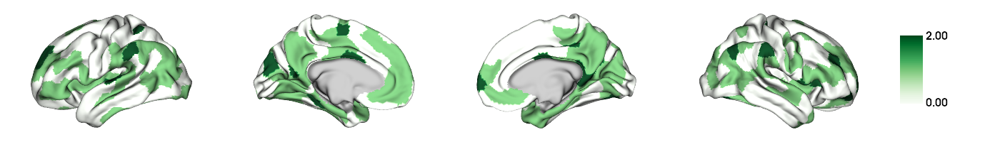

'Which dataset shows significant sex difference: +1 (purple) HCP G1 fc, -1 (brown) = HCP G2 CT, 0 (white) = both datasets, nan (grey) = not significant in any dataset'

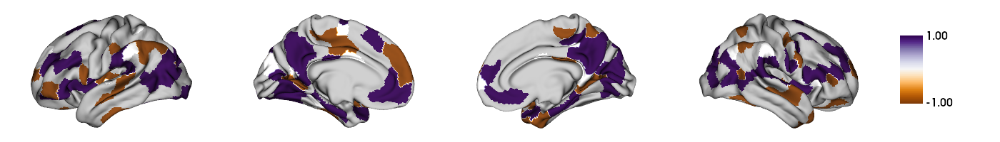

'Parcels showing sex differences in opposite directions'

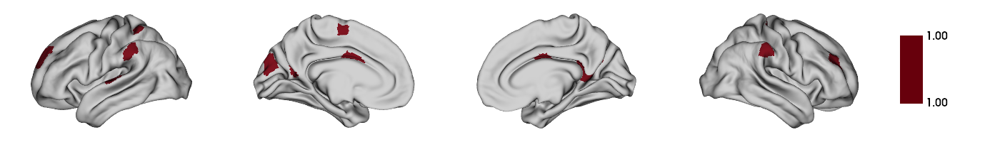

In [100]:
plots_to_display = plot_sig_overlap(reg_res_sample_1 = HCP_R_lmer_fc_G1_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_ct_G2_sex_contrast_res, sample_1_label = "HCP G1 fc", sample_2_label = "HCP G2 CT")
display(*plots_to_display)

#### Visualizing t-values of sex contrast by network

Minimum positive significant t-value in HCP G1 fc: 2.41
Minimum negative significant t-value in HCP G1 fc: -2.43

Number of positive significant t-values (M > F (gradient loadings)) in HCP G1 fc: 82 -> by network: {'visual': 23, 'sensory motor': 8, 'dorsal attention': 4, 'ventral attention': 29, 'limbic': 0, 'fronto parietal': 13, 'DMN': 5}
Number of negative significant t-values (F > M (gradient loadings)) in HCP G1 fc: 52 -> by network: {'visual': 6, 'sensory motor': 5, 'dorsal attention': 2, 'ventral attention': 1, 'limbic': 5, 'fronto parietal': 5, 'DMN': 28}


Minimum positive significant t-value in HCP G2 CT: 2.58
Minimum negative significant t-value in HCP G2 CT: -2.59

Number of positive significant t-values (M > F (gradient loadings)) in HCP G2 CT: 44 -> by network: {'visual': 3, 'sensory motor': 9, 'dorsal attention': 2, 'ventral attention': 9, 'limbic': 6, 'fronto parietal': 5, 'DMN': 10}
Number of negative significant t-values (F > M (gradient loadings)) in HCP G2 CT: 39 ->

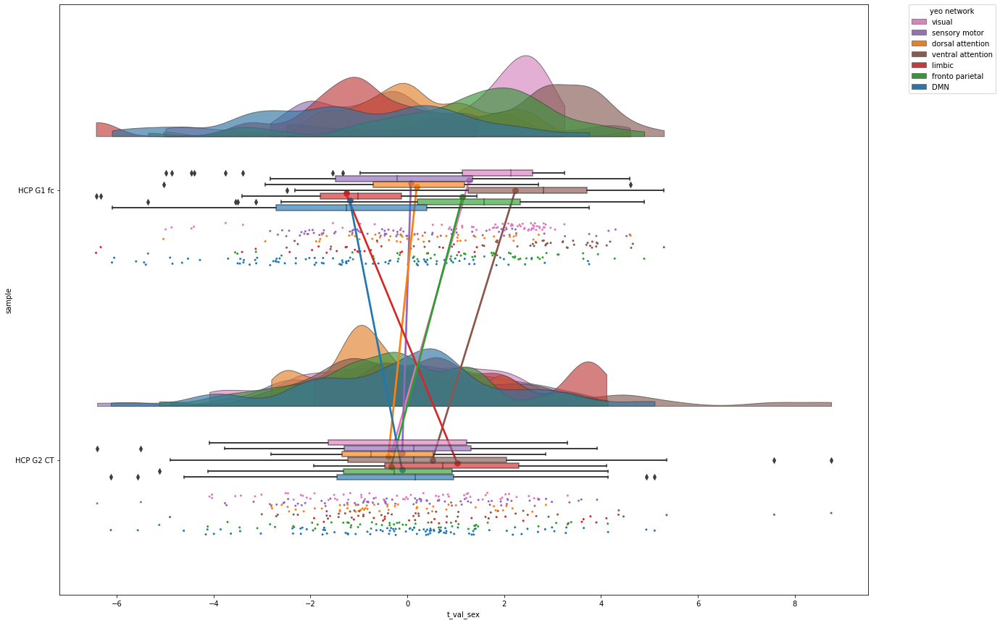

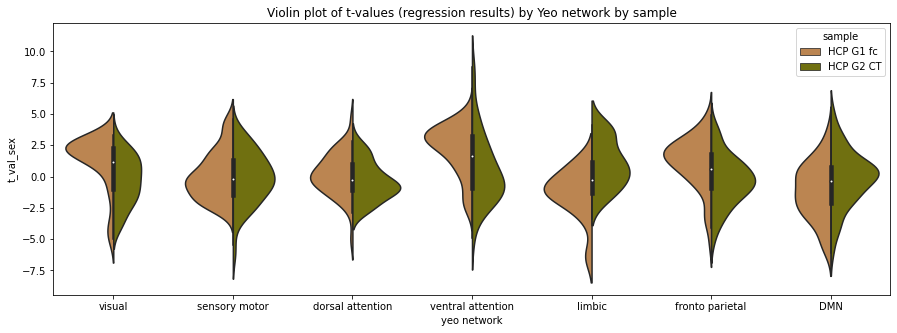

In [101]:
RainCloudPlot_YeoNetworks_SampleComparison_tval(reg_res_sample_1 = HCP_R_lmer_fc_G1_sex_contrast_res, reg_res_sample_2 = HCP_R_lmer_ct_G2_sex_contrast_res, sample_1_label = "HCP G1 fc", sample_2_label = "HCP G2 CT")